## 1. Introduction to Memecoins:


Memecoins are a unique category of cryptocurrencies that are often created as a joke or based on internet memes. They typically don’t have a serious use case or technological innovation behind them, but they often gain popularity due to viral internet trends, celebrity endorsements, or active communities. While some memecoins are created purely for fun, others can achieve significant market value, attracting investors and enthusiasts looking for short-term gains or novelty.


Memecoins have gained popularity for several reasons, primarily due to the influence of community-driven efforts and social media. Internet culture, including viral content and memes, plays a significant role in their rise. Platforms like Twitter, Reddit, and Discord have become key spaces where users promote their favorite memecoins, often relying on humor and collective enthusiasm to generate excitement. These communities are highly engaged and help maintain momentum by sharing memes, creating buzz, and encouraging others to get involved, often without the backing of traditional marketing efforts. Additionally, celebrity endorsements and media coverage have amplified the popularity of memecoins. High-profile figures like Elon Musk, with his frequent tweets about Dogecoin, have caused significant price surges and drawn mainstream attention. As a result, memecoins like Dogecoin and Shiba Inu often find themselves in the media spotlight, attracting new investors. Furthermore, the speculative nature of memecoins has made them highly appealing to traders looking for quick profits. Their volatility offers opportunities for short-term gains, while their low entry costs make them accessible to a broader audience, including those new to cryptocurrency. This combination of community engagement, celebrity endorsements, and speculative interest has contributed to the meteoric rise of memecoins in the cryptocurrency market.


## 2. Data Collection


In [15]:
!pip install requests
!pip install tweepy
!pip install tweepy --upgrade
!pip install pycoingecko
!pip install nltk
!pip install emoji
! pip install praw
!pip show praw
!pip install tensorflow
!pip install textblob
!pip install --upgrade scikit-learn
nltk.download('vader_lexicon')

**_Collect Data_**


In [9]:
import requests
#import tweepy
import pandas as pd
import datetime
from pycoingecko import CoinGeckoAPI
import os
import json
import time
import praw
import numpy as np
import seaborn as sns
import webbrowser
from pytrends.request import TrendReq
import nltk
from sklearn.model_selection import GridSearchCV
from nltk.sentiment import SentimentIntensityAnalyzer
import re
import matplotlib.pyplot as plt
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from math import sqrt
import glob
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from keras.models import Sequential
from keras.layers import LSTM, Dense
import tensorflow as tf
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import plotly.graph_objects as go

**Fetch The Single Crypto**


In [21]:
cg = CoinGeckoAPI()
currency = 'usd'
days = '365'
coin_ids = ['ripple']  # Fetch Bitcoin and Shiba Inu

print("Fetching historical data from CoinGecko...")

for coin_id in coin_ids:
    try:
        historical_data = cg.get_coin_market_chart_by_id(id=coin_id, vs_currency=currency, days=days)
        coin_details = cg.get_coin_by_id(id=coin_id)
        market_data = coin_details.get('market_data', {})

        if 'prices' in historical_data and coin_details:
            prices_list = historical_data['prices']
            df = pd.DataFrame(prices_list, columns=['Timestamp_ms', 'Price_USD'])

            # Convert milliseconds to datetime objects and set as index
            df['Timestamp'] = df['Timestamp_ms'].apply(lambda ms: datetime.datetime.fromtimestamp(ms / 1000))
            df.set_index('Timestamp', inplace=True)
            df.drop(columns=['Timestamp_ms'], inplace=True)

            # Add coin identifier and attributes
            df['Coin_ID'] = coin_id
            df['Symbol'] = coin_details.get('symbol', '').upper()
            df['Name'] = coin_details.get('name', '')

            # Market cap
            market_caps_df = pd.DataFrame(historical_data.get('market_caps', []), columns=['Timestamp_ms', 'Market_Cap_USD'])
            market_caps_df['Timestamp'] = market_caps_df['Timestamp_ms'].apply(lambda ms: datetime.datetime.fromtimestamp(ms / 1000))
            market_caps_df.set_index('Timestamp', inplace=True)
            df['Market_Cap_USD'] = market_caps_df['Market_Cap_USD']

            # Total volume
            total_volumes_df = pd.DataFrame(historical_data.get('total_volumes', []), columns=['Timestamp_ms', 'Total_Volume_USD'])
            total_volumes_df['Timestamp'] = total_volumes_df['Timestamp_ms'].apply(lambda ms: datetime.datetime.fromtimestamp(ms / 1000))
            total_volumes_df.set_index('Timestamp', inplace=True)
            df['Total_Volume_USD'] = total_volumes_df['Total_Volume_USD']

            # Constant metadata
            df['Market_Cap_Rank'] = coin_details.get('market_cap_rank')
            df['Total_Supply'] = coin_details.get('total_supply')
            df['Circulating_Supply'] = coin_details.get('circulating_supply')
            df['All_Time_High_USD'] = market_data.get('ath', {}).get('usd')
            df['All_Time_High_Date'] = market_data.get('ath_date', {}).get('usd')
            df['Price_Change_24h'] = market_data.get('price_change_24h')
            df['Price_Change_Percentage_24h'] = market_data.get('price_change_percentage_24h')
            df['Market_Cap_Change_24h'] = market_data.get('market_cap_change_24h')
            df['Market_Cap_Change_Percentage_24h'] = market_data.get('market_cap_change_percentage_24h')

            df.sort_index(inplace=True)

            # Export to CSV
            output_csv_filename = f"{coin_id}_market_data.csv"
            df.to_csv(output_csv_filename, index=True)

            print(f"Successfully fetched and exported data for {coin_details['name']} ({len(df)} records) to '{output_csv_filename}'.")
        else:
            print(f"Error: Incomplete data for {coin_id}.")
    except Exception as e:
        print(f"Error fetching data for {coin_id}: {e}")


Fetching historical data from CoinGecko...
Successfully fetched and exported data for XRP (366 records) to 'ripple_market_data.csv'.


**Fetch memecoins**


In [78]:
cg = CoinGeckoAPI()
currency = 'usd'
days = '365'
coin_ids = ['bitcoin','shiba-inu']
all_coins_dfs = [] # List to store individual DataFrames before concatenation

print("Fetching historical data from CoinGecko...")

for coin_id in coin_ids:
    historical_data = cg.get_coin_market_chart_by_id(id=coin_id, vs_currency=currency, days=days)
    coin_details = cg.get_coin_by_id(id=coin_id)
    market_data = coin_details.get('market_data', {})

    if 'prices' in historical_data and coin_details:
        prices_list = historical_data['prices']
        df = pd.DataFrame(prices_list, columns=['Timestamp_ms', 'Price_USD'])
        
        # Convert milliseconds to datetime objects and set as index
        df['Timestamp'] = df['Timestamp_ms'].apply(lambda ms: datetime.datetime.fromtimestamp(ms / 1000))
        df.set_index('Timestamp', inplace=True)
        df.drop(columns=['Timestamp_ms'], inplace=True)

        # Add coin identifier before adding other attributes
        df['Coin_ID'] = coin_id # This new column will help identify the coin after merging

        # Add more attributes from coin_details and historical data
        # Ensure lists are the same length as the DataFrame for proper alignment
        df['Symbol'] = coin_details.get('symbol', '').upper()
        df['Name'] = coin_details.get('name', '')
        
        # Market cap and total volume need to be aligned by date
        market_caps_df = pd.DataFrame(historical_data.get('market_caps', []), columns=['Timestamp_ms', 'Market_Cap_USD'])
        market_caps_df['Timestamp'] = market_caps_df['Timestamp_ms'].apply(lambda ms: datetime.datetime.fromtimestamp(ms / 1000))
        market_caps_df.set_index('Timestamp', inplace=True)
        df['Market_Cap_USD'] = market_caps_df['Market_Cap_USD'] # Assign by index

        total_volumes_df = pd.DataFrame(historical_data.get('total_volumes', []), columns=['Timestamp_ms', 'Total_Volume_USD'])
        total_volumes_df['Timestamp'] = total_volumes_df['Timestamp_ms'].apply(lambda ms: datetime.datetime.fromtimestamp(ms / 1000))
        total_volumes_df.set_index('Timestamp', inplace=True)
        df['Total_Volume_USD'] = total_volumes_df['Total_Volume_USD'] # Assign by index

        # These are constant for the coin, so assign directly
        df['Market_Cap_Rank'] = coin_details.get('market_cap_rank')
        df['Total_Supply'] = coin_details.get('total_supply')
        df['Circulating_Supply'] = coin_details.get('circulating_supply')
        df['All_Time_High_USD'] = market_data.get('ath', {}).get('usd')
        df['All_Time_High_Date'] = market_data.get('ath_date', {}).get('usd')
        df['Price_Change_24h'] = market_data.get('price_change_24h')
        df['Price_Change_Percentage_24h'] = market_data.get('price_change_percentage_24h')
        df['Market_Cap_Change_24h'] = market_data.get('market_cap_change_24h')
        df['Market_Cap_Change_Percentage_24h'] = market_data.get('market_cap_change_percentage_24h')

        all_coins_dfs.append(df)
        print(f"Successfully fetched data for {coin_details['name']} ({len(df)} records).")
    else:
        print(f"Error fetching historical data or details for {coin_id}. Skipping.")
        print(f"Historical Data: {historical_data}")
        print(f"Coin Details: {coin_details}")

# --- Merge all DataFrames into a single one ---
if all_coins_dfs:
    final_merged_df = pd.concat(all_coins_dfs)
    
    # Sort the merged DataFrame by Coin_ID and then by Timestamp for better organization
    final_merged_df.sort_values(by=['Coin_ID', 'Timestamp'], inplace=True)

    print("\n--- Merged Data Head ---")
    print(final_merged_df.head())
    print("\n--- Merged Data Tail (showing different coins) ---")
    print(final_merged_df.tail())
    print(f"\nTotal records in merged DataFrame: {len(final_merged_df)}")
    print(f"Unique coins in merged data: {final_merged_df['Coin_ID'].nunique()}")

    # --- Save the merged DataFrame to a single CSV file ---
    output_csv_filename = "all_memecoins_market_data.csv"
    final_merged_df.to_csv(output_csv_filename, index=True) # index=True saves the 'Timestamp' as a column
    print(f"\nAll data successfully exported to '{output_csv_filename}'")
else:
    print("\nNo data was successfully fetched to merge.")

Fetching historical data from CoinGecko...
Successfully fetched data for Dogecoin (366 records).
Successfully fetched data for Shiba Inu (366 records).
Successfully fetched data for Bitcoin (366 records).
Successfully fetched data for Cardano (366 records).

--- Merged Data Head ---
                        Price_USD  Coin_ID Symbol     Name  Market_Cap_USD  \
Timestamp                                                                    
2024-05-29 08:00:00  68316.635880  bitcoin    BTC  Bitcoin    1.347543e+12   
2024-05-30 08:00:00  67577.265590  bitcoin    BTC  Bitcoin    1.331734e+12   
2024-05-31 08:00:00  68372.492884  bitcoin    BTC  Bitcoin    1.346148e+12   
2024-06-01 08:00:00  67474.954837  bitcoin    BTC  Bitcoin    1.331606e+12   
2024-06-02 08:00:00  67704.326418  bitcoin    BTC  Bitcoin    1.333650e+12   

                     Total_Volume_USD  Market_Cap_Rank Total_Supply  \
Timestamp                                                             
2024-05-29 08:00:00      3.

**_Social Media_**


**Reddit**


In [14]:
APP_NAME = "Dennis"
APP_VERSION = "1.0"
REDDIT_USERNAME = "Successful_Cat_6509" 

reddit = praw.Reddit(
    client_id='1Z9QJVRYeyqdDPGmTfFuOg',
    client_secret='pKtQCeehtl8-LfNUgTO9llxZjXx5iw',
    user_agent= f"{APP_NAME}/{APP_VERSION} (by /u/{REDDIT_USERNAME})"
)

In [19]:
def fetch_posts_by_month_praw(subreddit_name, keyword, total_limit=2000, months_back=12, posts_per_month_limit=1000):
    all_data = []
    now = datetime.datetime.now(datetime.timezone.utc)
    subreddit = reddit.subreddit(subreddit_name)

    for month_offset in range(months_back):
        if len(all_data) >= total_limit:
            break

        # Calculate time range
        end_date = now - datetime.timedelta(days=month_offset * 30)
        start_date = end_date - datetime.timedelta(days=30)

        print(f"Fetching posts from {start_date.date()} to {end_date.date()} for r/{subreddit_name}")

        start_ts = start_date.timestamp()
        end_ts = end_date.timestamp()

        posts_fetched_this_month = 0

        for post in subreddit.new(limit=posts_per_month_limit * 5):  # oversample to filter by date
            if len(all_data) >= total_limit:
                break

            if start_ts <= post.created_utc < end_ts:
                post_created_at = datetime.datetime.utcfromtimestamp(post.created_utc)
                post_content = (post.title + " " + (post.selftext if post.selftext else "")).strip()
                if not post_content:
                    continue

                # Fetch comments
                try:
                    post.comments.replace_more(limit=None)
                    comments = [c.body.strip() for c in post.comments.list() if hasattr(c, 'body') and c.body.strip()]
                    comments_concat = " ||| ".join(comments) if comments else ""
                except Exception as e:
                    print(f"Error fetching comments for post {post.id}: {e}")
                    comments_concat = ""

                all_data.append({
                    'platform': 'Reddit',
                    'keyword': keyword,
                    'post_id': post.id,
                    'created_at': post_created_at,
                    'post_content': post_content,
                    'comments': comments_concat,
                    'post_upvotes': post.score,
                    'num_comments': post.num_comments
                })

                posts_fetched_this_month += 1
                if posts_fetched_this_month % 10 == 0:
                    print(f"  Fetched {posts_fetched_this_month} posts this month")

             
                if posts_fetched_this_month >= posts_per_month_limit:
                    break

            elif post.created_utc < start_ts:
                break  # Older than the date range, stop early

        print(f"Completed {posts_fetched_this_month} posts from {start_date.date()} to {end_date.date()}")
        time.sleep(2)

    return all_data

# --- MAIN EXECUTION ---

# You can change this to other coins like 'Bitcoin': 'Bitcoin', 'ShibaInu': 'SHIBArmy'
selected_subreddits = {
    'Cardano': 'Cardano',
}

for crypto_name, subreddit in selected_subreddits.items():
    print(f"\n Fetching posts and comments for {crypto_name} (r/{subreddit})...")
    crypto_data = fetch_posts_by_month_praw(
        subreddit_name=subreddit,
        keyword=crypto_name,
        total_limit=2000,
        months_back=12,
        posts_per_month_limit=100
    )

    # Export to CSV
    df = pd.DataFrame(crypto_data)
    filename = f"{crypto_name.lower().replace(' ', '_')}_reddit_data.csv"
    df.to_csv(filename, index=False)
    print(f"Exported {len(df)} posts to '{filename}'")

    time.sleep(3)


🚀 Fetching posts and comments for Cardano (r/Cardano)...
Fetching posts from 2025-05-05 to 2025-06-04 for r/Cardano
  Fetched 10 posts this month
  Fetched 20 posts this month
  Fetched 30 posts this month
  Fetched 40 posts this month
  Fetched 50 posts this month
  Fetched 60 posts this month
  Fetched 70 posts this month
  Fetched 80 posts this month
  Fetched 90 posts this month
  Fetched 100 posts this month
✅ Completed 100 posts from 2025-05-05 to 2025-06-04
Fetching posts from 2025-04-05 to 2025-05-05 for r/Cardano
  Fetched 10 posts this month
  Fetched 20 posts this month
  Fetched 30 posts this month
  Fetched 40 posts this month
  Fetched 50 posts this month
  Fetched 60 posts this month
  Fetched 70 posts this month
  Fetched 80 posts this month
  Fetched 90 posts this month
  Fetched 100 posts this month
✅ Completed 100 posts from 2025-04-05 to 2025-05-05
Fetching posts from 2025-03-06 to 2025-04-05 for r/Cardano
  Fetched 10 posts this month
  Fetched 20 posts this month

**NewsHeadlines**


In [ ]:
API_KEY = '6a913b6396024d10a3556536527e18e1'
query = 'memecoin OR dogecoin OR shiba inu'
from_date = '2025-04-29'
to_date = '2025-05-28'
page_size = 99
page = 1

url = (
    f'https://newsapi.org/v2/everything?'
    f'q={query}&'
    f'from={from_date}&'
    f'to={to_date}&'
    f'language=en&'
    f'pageSize={page_size}&'
    f'page={page}&'
    f'apiKey={API_KEY}'
)

response = requests.get(url)

if response.status_code == 200:
    data = response.json()
    articles = data.get('articles', [])
    if articles:
        # Create a DataFrame from the articles list
        df = pd.DataFrame(articles)

        # Optionally select relevant columns
        df = df[['source', 'author', 'title', 'description', 'url', 'publishedAt', 'content']]

        # 'source' is a dict, so flatten it to just source name
        df['source'] = df['source'].apply(lambda x: x.get('name') if isinstance(x, dict) else x)

        # Rename 'publishedAt' to 'published_at' for clarity (optional)
        df.rename(columns={'publishedAt': 'published_at'}, inplace=True)

        # Export to CSV
        csv_filename = 'memecoin_news.csv'
        df.to_csv(csv_filename, index=False)
        print(f"Saved {len(df)} articles to '{csv_filename}'")
    else:
        print("No articles found in this date range.")
else:
    print(f"Error fetching news: {response.status_code} - {response.text}")

**Search Trends**


In [150]:
import time

kw_list = ["XRP"]

for kw in kw_list:
    pytrends.build_payload([kw], timeframe='today 12-m')
    data = pytrends.interest_over_time()
    data.to_csv(f"{kw}_search_trend.csv")
    print(f"Saved data for {kw}")
    time.sleep(180)  # wait at least 10–15 seconds


TooManyRequestsError: The request failed: Google returned a response with code 429

## 3. Sentiment Test & Preprocessing Data


**Preprocess the market data and sentiment analysis for crypto**


In [14]:
# --- 1. Load Ripple price data ---
price_df = pd.read_csv("ripple_market_data.csv", parse_dates=["Timestamp"])
price_df["date"] = pd.to_datetime(price_df["Timestamp"].dt.date)

# --- 2. Load Reddit posts data ---
reddit_df = pd.read_csv("xrp_reddit_data.csv", parse_dates=["created_at"])
reddit_df["full_text"] = reddit_df["post_content"].astype(str) + " " + reddit_df["comments"].astype(str)
reddit_df["date"] = pd.to_datetime(reddit_df["created_at"].dt.date)

# --- 3. Sentiment analysis on Reddit posts ---
sia = SentimentIntensityAnalyzer()
reddit_df["sentiment"] = reddit_df["full_text"].apply(lambda x: sia.polarity_scores(x)["compound"])

# --- 4. Aggregate sentiment by date ---
daily_sentiment = reddit_df.groupby("date")["sentiment"].mean().reset_index()
daily_sentiment.rename(columns={"sentiment": "reddit_sentiment"}, inplace=True)

# --- 4.5 Fill missing sentiment dates ---
full_date_range = pd.date_range(start=price_df["date"].min(), end=price_df["date"].max())
daily_sentiment = daily_sentiment.set_index("date").reindex(full_date_range)
daily_sentiment.index.name = "date"
daily_sentiment["reddit_sentiment"].fillna(0, inplace=True)
daily_sentiment = daily_sentiment.reset_index()

# --- 5. Merge price data with daily sentiment ---
df_xrp = pd.merge(price_df, daily_sentiment, on="date", how="left")
df_xrp["reddit_sentiment"].fillna(0, inplace=True)

# Load search trend
trend_df = pd.read_csv("XRP_search_trend.csv")

# Convert date to datetime and rename column for clarity
trend_df["date"] = pd.to_datetime(trend_df["date"])
trend_df.rename(columns={"XRP": "search_trend"}, inplace=True)

# Forward-fill search data to make it daily
trend_df = trend_df.set_index("date").resample("D").ffill().reset_index()

# Optionally: Lag the search trend by 1 day to avoid leakage
trend_df["search_trend_lag1"] = trend_df["search_trend"].shift(1)

# Merge with your existing dataframe (df_xrp)
df_xrp = pd.merge(df_xrp, trend_df[["date", "search_trend", "search_trend_lag1"]], on="date", how="left")

# Fill missing values if any (e.g., first row due to lag)
df_xrp["search_trend"].fillna(method="ffill", inplace=True)
df_xrp["search_trend_lag1"].fillna(method="ffill", inplace=True)

# Rolling average
df_xrp["search_trend_roll3"] = df_xrp["search_trend"].rolling(3).mean()

# Trend momentum
df_xrp["search_trend_momentum_1"] = df_xrp["search_trend"] - df_xrp["search_trend_lag1"]

# Volatility (how much interest fluctuates)
df_xrp["search_trend_volatility_7"] = df_xrp["search_trend"].rolling(7).std()

# --- 6. Create features ---
df_xrp = df_xrp.sort_values("Timestamp")
df_xrp["Price_USD_lag1"] = df_xrp["Price_USD"].shift(1)
df_xrp["Price_USD_lag2"] = df_xrp["Price_USD"].shift(2)
df_xrp["Price_USD_lag3"] = df_xrp["Price_USD"].shift(3)
df_xrp["reddit_sentiment_lag1"] = df_xrp["reddit_sentiment"].shift(1)
df_xrp["reddit_sentiment_lag3"] = df_xrp["reddit_sentiment"].shift(3)
df_xrp["reddit_sentiment_roll3"] = df_xrp["reddit_sentiment"].rolling(3).mean()
df_xrp["Price_USD_ema_7"] = df_xrp["Price_USD"].ewm(span=7, adjust=False).mean()
df_xrp["Price_USD_ema_14"] = df_xrp["Price_USD"].ewm(span=14, adjust=False).mean()

def compute_rsi(series, period=14):
    delta = series.diff()
    gain = delta.clip(lower=0)
    loss = -1 * delta.clip(upper=0)
    avg_gain = gain.rolling(window=period).mean()
    avg_loss = loss.rolling(window=period).mean()
    rs = avg_gain / avg_loss
    return 100 - (100 / (1 + rs))

df_xrp["Price_USD_rsi_14"] = compute_rsi(df_xrp["Price_USD"], 14)
df_xrp["Price_USD_volatility_7"] = df_xrp["Price_USD"].rolling(window=7).std()
df_xrp["Price_USD_return_1d"] = df_xrp["Price_USD"].pct_change(1)
df_xrp["Price_USD_return_3d"] = df_xrp["Price_USD"].pct_change(3)
df_xrp["day_of_week"] = df_xrp["Timestamp"].dt.dayofweek
df_xrp["is_weekend"] = df_xrp["day_of_week"].isin([5,6]).astype(int)
df_xrp["Price_USD_sma_7"] = df_xrp["Price_USD"].rolling(window=7).mean()
df_xrp["Price_USD_sma_14"] = df_xrp["Price_USD"].rolling(window=14).mean()
ema_12 = df_xrp["Price_USD"].ewm(span=12, adjust=False).mean()
ema_26 = df_xrp["Price_USD"].ewm(span=26, adjust=False).mean()
df_xrp["Price_USD_macd"] = ema_12 - ema_26
df_xrp["Price_USD_macd_signal"] = df_xrp["Price_USD_macd"].ewm(span=9, adjust=False).mean()
sma_20 = df_xrp["Price_USD"].rolling(window=20).mean()
std_20 = df_xrp["Price_USD"].rolling(window=20).std()
df_xrp["bb_upper"] = sma_20 + (2 * std_20)
df_xrp["bb_lower"] = sma_20 - (2 * std_20)
df_xrp["reddit_sentiment_volatility_7"] = df_xrp["reddit_sentiment"].rolling(7).std()
df_xrp["reddit_sentiment_momentum_1"] = df_xrp["reddit_sentiment"] - df_xrp["reddit_sentiment_lag1"]
df_xrp["month"] = df_xrp["Timestamp"].dt.month
df_xrp["quarter"] = df_xrp["Timestamp"].dt.quarter

# Drop unused and NaN rows
df_xrp = df_xrp.drop(columns=["Total_Supply", "Circulating_Supply"])
df_xrp = df_xrp.dropna()

# --- 7. Define features and target ---
feature_cols = [
    "Price_USD_lag1", "Price_USD_lag2", "Price_USD_lag3",
    "reddit_sentiment", "reddit_sentiment_lag1", "reddit_sentiment_lag3", "reddit_sentiment_roll3",
    "Price_USD_ema_7", "Price_USD_ema_14",
    "Price_USD_rsi_14", "Price_USD_volatility_7",
    "Price_USD_return_1d", "Price_USD_return_3d",
    "day_of_week", "is_weekend",
    "Price_USD_sma_7", "Price_USD_sma_14",
    "Price_USD_macd", "Price_USD_macd_signal",
    "bb_upper", "bb_lower",
    "reddit_sentiment_volatility_7", "reddit_sentiment_momentum_1",
    "month", "quarter",
    "search_trend", "search_trend_lag1",
    "search_trend_roll3"
]
target_col = "Price_USD"

X_xrp = df_xrp[feature_cols]
y_xrp = df_xrp[target_col]

# --- 8. Train/test split ---
split_idx = int(len(df_xrp) * 0.8)
X_train_xrp, X_test_xrp = X_xrp.iloc[:split_idx], X_xrp.iloc[split_idx:]
y_train_xrp, y_test_xrp = y_xrp.iloc[:split_idx], y_xrp.iloc[split_idx:]

print(f"X_train_xrp shape: {X_train_xrp.shape}")
print(f"X_test_xrp shape: {X_test_xrp.shape}")
print(f"y_train_xrp shape: {y_train_xrp.shape}")
print(f"y_test_xrp shape: {y_test_xrp.shape}")


X_train_xrp shape: (277, 28)
X_test_xrp shape: (70, 28)
y_train_xrp shape: (277,)
y_test_xrp shape: (70,)


**Preprocess dogecoin data**


In [26]:
#read the datasets
doge_price_df = pd.read_csv('all_memecoins_market_data.csv', parse_dates=["Timestamp"])
doge_reddit_df = pd.read_csv('reddit_crypto_processed_for_training.csv', parse_dates=["created_at"])
doge_search_trend_df = pd.read_csv('search_trends_extended.csv', parse_dates=["date"])

print("Dataset shapes:")
print(f"Market data: {doge_price_df.shape}")
print(f"Reddit data: {doge_reddit_df.shape}")
print(f"Search trend data: {doge_search_trend_df.shape}")

# Display basic info
print("\nMarket data columns:")
print(doge_price_df.columns.tolist())
print("\nReddit data columns:")
print(doge_reddit_df.columns.tolist())
print("\nSearch trend data columns:")
print(doge_search_trend_df.columns.tolist())

Dataset shapes:
Market data: (1464, 20)
Reddit data: (29458, 10)
Search trend data: (53, 6)

Market data columns:
['Timestamp', 'Price_USD', 'Coin_ID', 'Symbol', 'Name', 'Market_Cap_USD', 'Total_Volume_USD', 'Market_Cap_Rank', 'Total_Supply', 'Circulating_Supply', 'All_Time_High_USD', 'All_Time_High_Date', 'Price_Change_24h', 'Price_Change_Percentage_24h', 'Market_Cap_Change_24h', 'Market_Cap_Change_Percentage_24h', 'Daily_Return_%', '7d_Rolling_Avg_Price', '7d_Rolling_Std_Price', 'Market_Cap_per_Coin']

Reddit data columns:
['platform', 'keyword', 'post_id', 'created_at', 'post_content_clean', 'post_sentiment', 'post_upvotes', 'num_comments', 'comment_clean', 'comment_sentiment']

Search trend data columns:
['date', 'dogecoin', 'shiba inu', 'cardano', 'bitcoin', 'isPartial']


In [27]:
# Round Timestamp to date
doge_price_df["date"] = doge_price_df["Timestamp"].dt.date
doge_price_df["date"] = pd.to_datetime(doge_price_df["date"])
# Filter for Dogecoin data
doge_price_df=doge_price_df[doge_price_df["Symbol"] == "DOGE"]

# Round created_at to date
doge_reddit_df["date"] = doge_reddit_df["created_at"].dt.date
doge_reddit_df["date"] = pd.to_datetime(doge_reddit_df["date"])
# Filter for Dogecoin posts
doge_reddit_df = doge_reddit_df[doge_reddit_df["keyword"] == "Dogecoin"] 

# Round created_at to date
doge_search_trend_df["date"] = doge_search_trend_df["date"].dt.date
doge_search_trend_df["date"] = pd.to_datetime(doge_search_trend_df["date"])


print(f'Dogecoin market data points: {len(doge_price_df)}')
print(f'Dogecoin Reddit data points: {len(doge_reddit_df)}')
print(f'Dogecoin search trend data points: {len(doge_search_trend_df)}')

Dogecoin market data points: 366
Dogecoin Reddit data points: 7172
Dogecoin search trend data points: 53


In [28]:
# Combine post_content and comments into one text column
doge_reddit_df["full_text"] = doge_reddit_df["post_content_clean"].astype(str) + " " + doge_reddit_df["comment_clean"].astype(str)
sia = SentimentIntensityAnalyzer()
doge_reddit_df["sentiment"] = doge_reddit_df["full_text"].apply(lambda x: sia.polarity_scores(x)["compound"])

# Aggregate sentiment by date 
daily_sentiment = doge_reddit_df.groupby("date")["sentiment"].mean().reset_index()
daily_sentiment.rename(columns={"sentiment": "reddit_sentiment"}, inplace=True)

# Fill missing sentiment dates 
full_date_range = pd.date_range(start=doge_price_df["date"].min(), end=doge_price_df["date"].max())
daily_sentiment = daily_sentiment.set_index("date").reindex(full_date_range)
daily_sentiment.index.name = "date"
daily_sentiment["reddit_sentiment"].fillna(0, inplace=True)
daily_sentiment = daily_sentiment.reset_index()

# Rename column dogecoin to search_trend
doge_search_trend_df.rename(columns={"dogecoin": "search_trend"}, inplace=True)

# Forward-fill search data to make it daily
doge_search_trend_df = doge_search_trend_df.set_index("date").resample("D").ffill().reset_index()

df = pd.merge(doge_price_df, daily_sentiment, on="date", how="left")
df = pd.merge(df, doge_search_trend_df[['date','search_trend']], on="date", how="left")

# Fill missing sentiment with 0 (neutral)
df["reddit_sentiment"].fillna(0, inplace=True)

#Sort by timestamp
df = df.sort_values("Timestamp")
print(df.head())

            Timestamp  Price_USD   Coin_ID Symbol      Name  Market_Cap_USD  \
0 2024-05-29 08:00:00   0.165015  dogecoin   DOGE  Dogecoin    2.387188e+10   
1 2024-05-30 08:00:00   0.163694  dogecoin   DOGE  Dogecoin    2.365774e+10   
2 2024-05-31 08:00:00   0.159511  dogecoin   DOGE  Dogecoin    2.305654e+10   
3 2024-06-01 08:00:00   0.159116  dogecoin   DOGE  Dogecoin    2.303717e+10   
4 2024-06-02 08:00:00   0.160153  dogecoin   DOGE  Dogecoin    2.313651e+10   

   Total_Volume_USD  Market_Cap_Rank  Total_Supply  Circulating_Supply  ...  \
0      1.195418e+09                8           0.0                 0.0  ...   
1      1.276072e+09                8           0.0                 0.0  ...   
2      1.246129e+09                8           0.0                 0.0  ...   
3      8.312629e+08                8           0.0                 0.0  ...   
4      4.580294e+08                8           0.0                 0.0  ...   

   Price_Change_Percentage_24h Market_Cap_Change_2

In [30]:
# Create lag features, technical indicators, and date features 
# Lag features
df["Price_USD_lag1"] = df["Price_USD"].shift(1)
df["Price_USD_lag2"] = df["Price_USD"].shift(2)
df["Price_USD_lag3"] = df["Price_USD"].shift(3)
df["reddit_sentiment_lag1"] = df["reddit_sentiment"].shift(1)
df["reddit_sentiment_lag3"] = df["reddit_sentiment"].shift(3)
df["reddit_sentiment_roll3"] = df["reddit_sentiment"].rolling(3).mean()

# EMA features
df["Price_USD_ema_7"] = df["Price_USD"].ewm(span=7, adjust=False).mean()
df["Price_USD_ema_14"] = df["Price_USD"].ewm(span=14, adjust=False).mean()

# RSI function
def compute_rsi(series, period=14):
    delta = series.diff()
    gain = delta.clip(lower=0)
    loss = -1 * delta.clip(upper=0)
    avg_gain = gain.rolling(window=period).mean()
    avg_loss = loss.rolling(window=period).mean()
    rs = avg_gain / avg_loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

df["Price_USD_rsi_14"] = compute_rsi(df["Price_USD"], 14)

# Volatility (rolling std dev)
df["Price_USD_volatility_7"] = df["Price_USD"].rolling(window=7).std()

# Returns (pct change)
df["Price_USD_return_1d"] = df["Price_USD"].pct_change(1)
df["Price_USD_return_3d"] = df["Price_USD"].pct_change(3)

# Date/time features
df["day_of_week"] = df["Timestamp"].dt.dayofweek
df["is_weekend"] = df["day_of_week"].isin([5,6]).astype(int)

# --- New additional features ---

# SMA features
df["Price_USD_sma_7"] = df["Price_USD"].rolling(window=7).mean()
df["Price_USD_sma_14"] = df["Price_USD"].rolling(window=14).mean()

# MACD features
ema_12 = df["Price_USD"].ewm(span=12, adjust=False).mean()
ema_26 = df["Price_USD"].ewm(span=26, adjust=False).mean()
df["Price_USD_macd"] = ema_12 - ema_26
df["Price_USD_macd_signal"] = df["Price_USD_macd"].ewm(span=9, adjust=False).mean()

# Bollinger Bands
sma_20 = df["Price_USD"].rolling(window=20).mean()
std_20 = df["Price_USD"].rolling(window=20).std()
df["bb_upper"] = sma_20 + (2 * std_20)
df["bb_lower"] = sma_20 - (2 * std_20)

# Additional sentiment features
df["reddit_sentiment_volatility_7"] = df["reddit_sentiment"].rolling(7).std()
df["reddit_sentiment_momentum_1"] = df["reddit_sentiment"] - df["reddit_sentiment_lag1"]

# Additional date/time features
df["month"] = df["Timestamp"].dt.month
df["quarter"] = df["Timestamp"].dt.quarter

df["search_trend_lag1"] = df["search_trend"].shift(1)

# Fill missing values if any (e.g., first row due to lag)
df["search_trend"].fillna(method="ffill", inplace=True)
df["search_trend_lag1"].fillna(method="ffill", inplace=True)

# Rolling average
df["search_trend_roll3"] = df["search_trend"].rolling(3).mean()

# Trend momentum
df["search_trend_momentum_1"] = df["search_trend"] - df["search_trend_lag1"]

# Volatility (how much interest fluctuates)
df["search_trend_volatility_7"] = df["search_trend"].rolling(7).std()

# Drop columns you don't need
df = df.drop(columns=["Total_Supply", "Circulating_Supply"])

# Drop rows with NaNs created by shifts, rolling, pct_change, and new features
df = df.dropna()


In [31]:
feature_cols = [
    "Price_USD_lag1", "Price_USD_lag2", "Price_USD_lag3",
    "reddit_sentiment", "reddit_sentiment_lag1", "reddit_sentiment_lag3", "reddit_sentiment_roll3",
    "Price_USD_ema_7", "Price_USD_ema_14",
    "Price_USD_rsi_14",
    "Price_USD_volatility_7",
    "Price_USD_return_1d", "Price_USD_return_3d",
    "day_of_week", "is_weekend",
    "Price_USD_sma_7", "Price_USD_sma_14",
    "Price_USD_macd", "Price_USD_macd_signal",
    "bb_upper", "bb_lower",
    "reddit_sentiment_volatility_7", "reddit_sentiment_momentum_1",
    "month", "quarter",
    "search_trend", "search_trend_lag1",
    "search_trend_roll3", "search_trend_momentum_1", "search_trend_volatility_7"
]

target_col = "Price_USD"

X = df[feature_cols]
y = df[target_col]

# Train/test split (no shuffle because time series)
split_idx = int(len(df)*0.8)
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]
y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]

print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (277, 30)
X_test shape: (70, 30)
y_train shape: (277,)
y_test shape: (70,)


**Sentiment analysis for reddit data for memecoin**


In [32]:
def clean_text(text):
    if not isinstance(text, str):
        return ""
    # Basic cleaning: remove URLs, newlines, extra spaces
    text = re.sub(r'http\S+', '', text)  # remove URLs
    text = text.replace('\n', ' ').replace('\r', ' ')
    text = re.sub(r'\s+', ' ', text).strip()
    return text

def process_reddit_dataset(input_csv, output_csv, comment_delimiter=" ||| "):
    df = pd.read_csv(input_csv)
    
    sia = SentimentIntensityAnalyzer()
    
    # Clean post content
    df['post_content_clean'] = df['post_content'].apply(clean_text)
    
    # Sentiment on post content
    df['post_sentiment'] = df['post_content_clean'].apply(lambda x: sia.polarity_scores(x)['compound'])
    
    # Explode comments into separate rows with sentiment
    # 1) Split comments by delimiter into lists
    df['comments_list'] = df['comments'].fillna("").apply(lambda x: x.split(comment_delimiter) if x else [])
    
    # 2) Explode to one comment per row
    df_exploded = df.explode('comments_list').reset_index(drop=True)
    
    # 3) Clean comments
    df_exploded['comment_clean'] = df_exploded['comments_list'].apply(clean_text)
    
    # 4) Calculate sentiment for each comment
    df_exploded['comment_sentiment'] = df_exploded['comment_clean'].apply(lambda x: sia.polarity_scores(x)['compound'] if x else 0)
    
    # Filter out empty comments
    df_exploded = df_exploded[df_exploded['comment_clean'] != ""].copy()
    
    # Select useful columns for training
    # You can adjust based on your model needs
    processed_df = df_exploded[[
        'platform',      # e.g. Reddit
        'keyword',       # e.g. Dogecoin, Bitcoin
        'post_id',
        'created_at',    # datetime
        'post_content_clean',
        'post_sentiment',
        'post_upvotes',
        'num_comments',
        'comment_clean',
        'comment_sentiment'
    ]]
    
    # Save processed dataset
    processed_df.to_csv(output_csv, index=False)
    print(f"Processed dataset saved to '{output_csv}'")
    print(f"Total records (comments exploded): {len(processed_df)}")
    print(f"Date range: {processed_df['created_at'].min()} to {processed_df['created_at'].max()}")

# Usage example:
input_csv = 'reddit_memecoin_crypto_data.csv'               # Raw dataset from your fetch script
output_csv = 'reddit_crypto_processed_for_training.csv'     # Output for training

process_reddit_dataset(input_csv, output_csv)

KeyboardInterrupt: 

## 4. EDA&Visualization


**DogeCoin EDA**


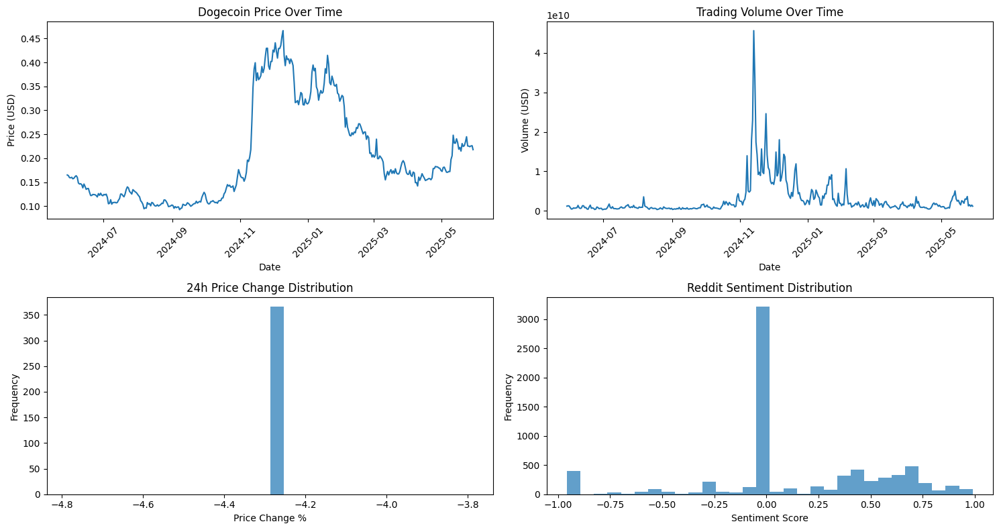

In [17]:
# Visualize Dogecoin price trend
plt.figure(figsize=(15, 8))
plt.subplot(2, 2, 1)
plt.plot(price_df['Timestamp'], price_df['Price_USD'])
plt.title('Dogecoin Price Over Time')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.xticks(rotation=45)

plt.subplot(2, 2, 2)
plt.plot(price_df['Timestamp'], price_df['Total_Volume_USD'])
plt.title('Trading Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Volume (USD)')
plt.xticks(rotation=45)

plt.subplot(2, 2, 3)
plt.hist(price_df['Price_Change_Percentage_24h'].dropna(), bins=30, alpha=0.7)
plt.title('24h Price Change Distribution')
plt.xlabel('Price Change %')
plt.ylabel('Frequency')

plt.subplot(2, 2, 4)
plt.hist(reddit_df['post_sentiment'].dropna(), bins=30, alpha=0.7)
plt.title('Reddit Sentiment Distribution')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

**XRP EDA**


Summary stats


In [245]:
df_xrp.describe()

,Timestamp,Price_USD,Market_Cap_USD,Total_Volume_USD,Market_Cap_Rank,All_Time_High_USD,Price_Change_24h,Price_Change_Percentage_24h,Market_Cap_Change_24h,Market_Cap_Change_Percentage_24h,...,Price_USD_sma_7,Price_USD_sma_14,Price_USD_macd,Price_USD_macd_signal,bb_upper,bb_lower,reddit_sentiment_volatility_7,reddit_sentiment_momentum_1,month,quarter
count,347,347.000000,3.470000e+02,3.470000e+02,347.0,3.470000e+02,347.000000,3.470000e+02,3.470000e+02,3.470000e+02,...,347.000000,347.000000,347.000000,347.000000,347.000000,347.000000,347.000000,3.470000e+02,347.000000,347.000000
mean,2024-12-14 07:57:19.461095168,1.578134,9.098095e+10,4.985418e+09,4.0,3.400000e+00,0.054875,2.507280e+00,3.038990e+09,2.363060e+00,...,1.563205,1.545490,0.036155,0.036188,1.794786,1.264615,0.409138,-1.919694e-18,6.553314,2.536023
min,2024-06-24 08:00:00,0.419179,2.330165e+10,2.955770e+08,4.0,3.400000e+00,0.054875,2.507280e+00,3.038990e+09,2.363060e+00,...,0.433325,0.452009,-0.125834,-0.097484,0.500285,0.213173,0.000000,-1.741500e+00,1.000000,1.000000
25%,2024-09-18 20:00:00,0.567252,3.187631e+10,1.372884e+09,4.0,3.400000e+00,0.054875,2.507280e+00,3.038990e+09,2.363060e+00,...,0.566848,0.565554,-0.012924,-0.010720,0.625515,0.501169,0.362199,-1.394840e-01,3.000000,1.000000
50%,2024-12-14 08:00:00,2.074720,1.204988e+11,2.871045e+09,4.0,3.400000e+00,0.054875,2.507280e+00,3.038990e+09,2.363060e+00,...,2.076218,2.039386,0.003817,0.004709,2.300808,1.225105,0.447585,0.000000e+00,7.000000,3.000000
75%,2025-03-10 20:00:00,2.354949,1.371476e+11,5.838588e+09,4.0,3.400000e+00,0.054875,2.507280e+00,3.038990e+09,2.363060e+00,...,2.376368,2.350320,0.053789,0.060215,2.626566,2.035070,0.509038,1.776750e-01,10.000000,4.000000
max,2025-06-04 16:31:33,3.307161,1.903861e+11,5.382000e+10,4.0,3.400000e+00,0.054875,2.507280e+00,3.038990e+09,2.363060e+00,...,3.175324,3.132728,0.439047,0.392578,3.608690,2.702780,0.782418,1.771600e+00,12.000000,4.000000
std,NaN,0.925636,5.397749e+10,6.123903e+09,0.0,8.894610e-16,0.000000,4.447305e-16,0.000000e+00,4.447305e-16,...,0.923154,0.920815,0.110358,0.104074,1.086359,0.794291,0.169281,6.106146e-01,3.539114,1.140809


Check data types and missing values


In [246]:
df_xrp.info()
df_xrp.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Index: 347 entries, 19 to 365
Data columns (total 45 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   Timestamp                         347 non-null    datetime64[ns]
 1   Price_USD                         347 non-null    float64       
 2   Coin_ID                           347 non-null    object        
 3   Symbol                            347 non-null    object        
 4   Name                              347 non-null    object        
 5   Market_Cap_USD                    347 non-null    float64       
 6   Total_Volume_USD                  347 non-null    float64       
 7   Market_Cap_Rank                   347 non-null    int64         
 8   All_Time_High_USD                 347 non-null    float64       
 9   All_Time_High_Date                347 non-null    object        
 10  Price_Change_24h                  347 non-null    floa

Timestamp                           0
Price_USD                           0
Coin_ID                             0
Symbol                              0
Name                                0
Market_Cap_USD                      0
Total_Volume_USD                    0
Market_Cap_Rank                     0
All_Time_High_USD                   0
All_Time_High_Date                  0
Price_Change_24h                    0
Price_Change_Percentage_24h         0
Market_Cap_Change_24h               0
Market_Cap_Change_Percentage_24h    0
date                                0
reddit_sentiment                    0
search_trend                        0
search_trend_lag1                   0
search_trend_roll3                  0
search_trend_momentum_1             0
search_trend_volatility_7           0
Price_USD_lag1                      0
Price_USD_lag2                      0
Price_USD_lag3                      0
reddit_sentiment_lag1               0
reddit_sentiment_lag3               0
reddit_senti

Plot Ripple price over time


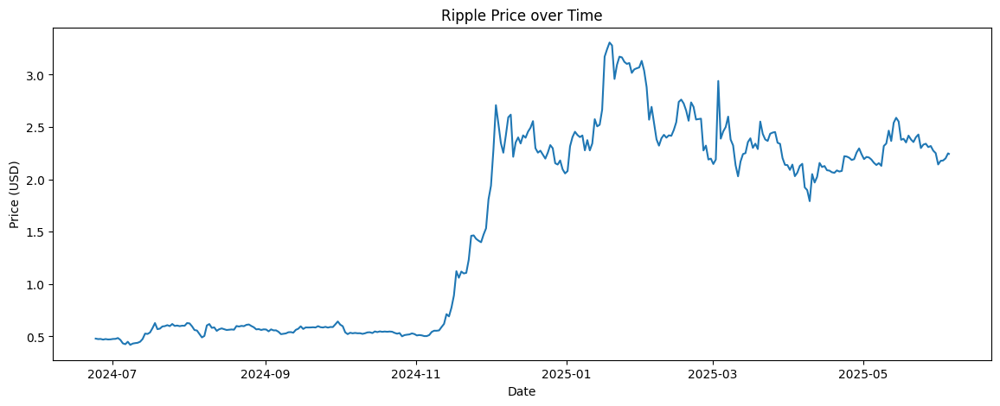

In [247]:
import matplotlib.pyplot as plt
plt.figure(figsize=(14,5))
plt.plot(df_xrp['Timestamp'], df_xrp['Price_USD'])
plt.title('Ripple Price over Time')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.show()

Plot trading volume over time


Text(0, 0.5, 'Volume (USD)')

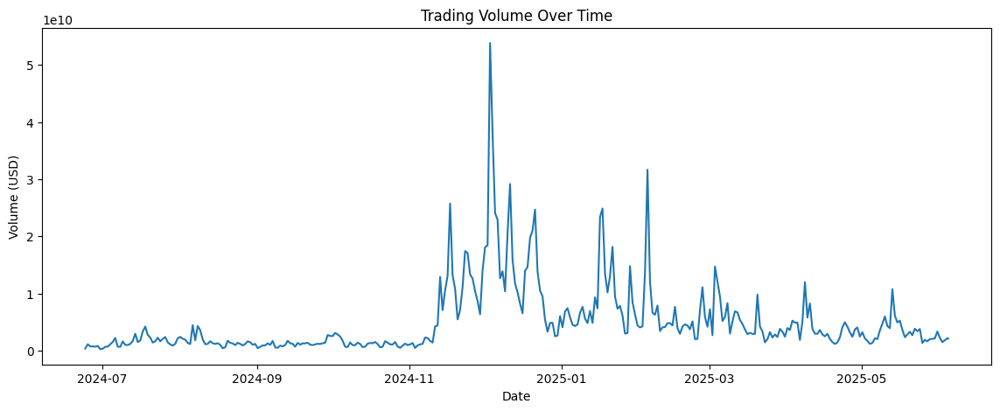

In [38]:
plt.figure(figsize=(14,5))
plt.plot(df_xrp['Timestamp'], df_xrp['Total_Volume_USD'])
plt.title('Trading Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Volume (USD)')

Plot Reddit sentiment over time


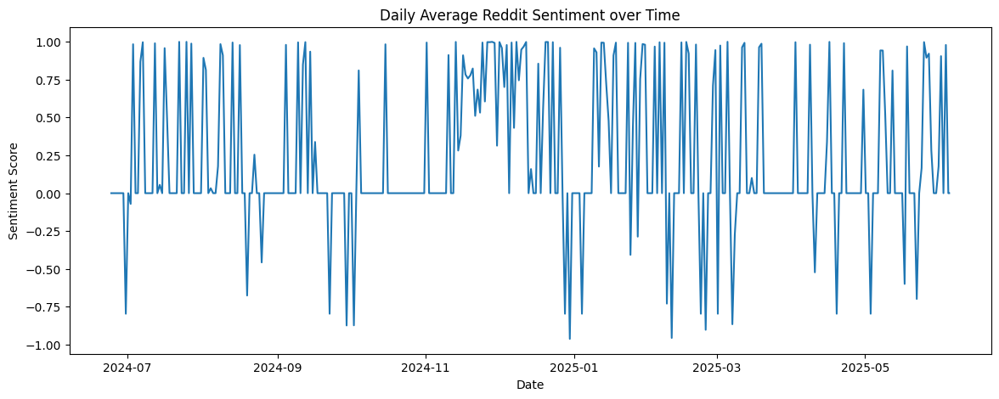

In [248]:
plt.figure(figsize=(14,5))
plt.plot(df_xrp['Timestamp'], df_xrp['reddit_sentiment'])
plt.title('Daily Average Reddit Sentiment over Time')
plt.xlabel('Date')
plt.ylabel('Sentiment Score')
plt.show()

Plot search trends over time


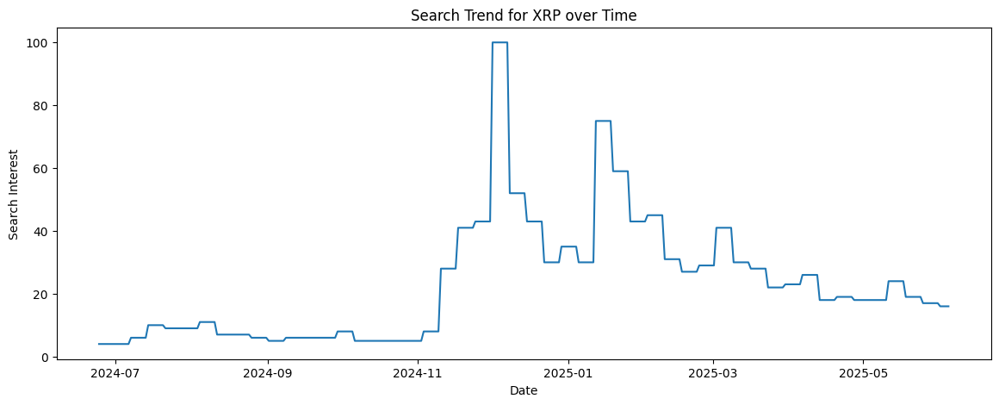

In [249]:
plt.figure(figsize=(14,5))
plt.plot(df_xrp['Timestamp'], df_xrp['search_trend'])
plt.title('Search Trend for XRP over Time')
plt.xlabel('Date')
plt.ylabel('Search Interest')
plt.show()

Heatmap of feature correlations


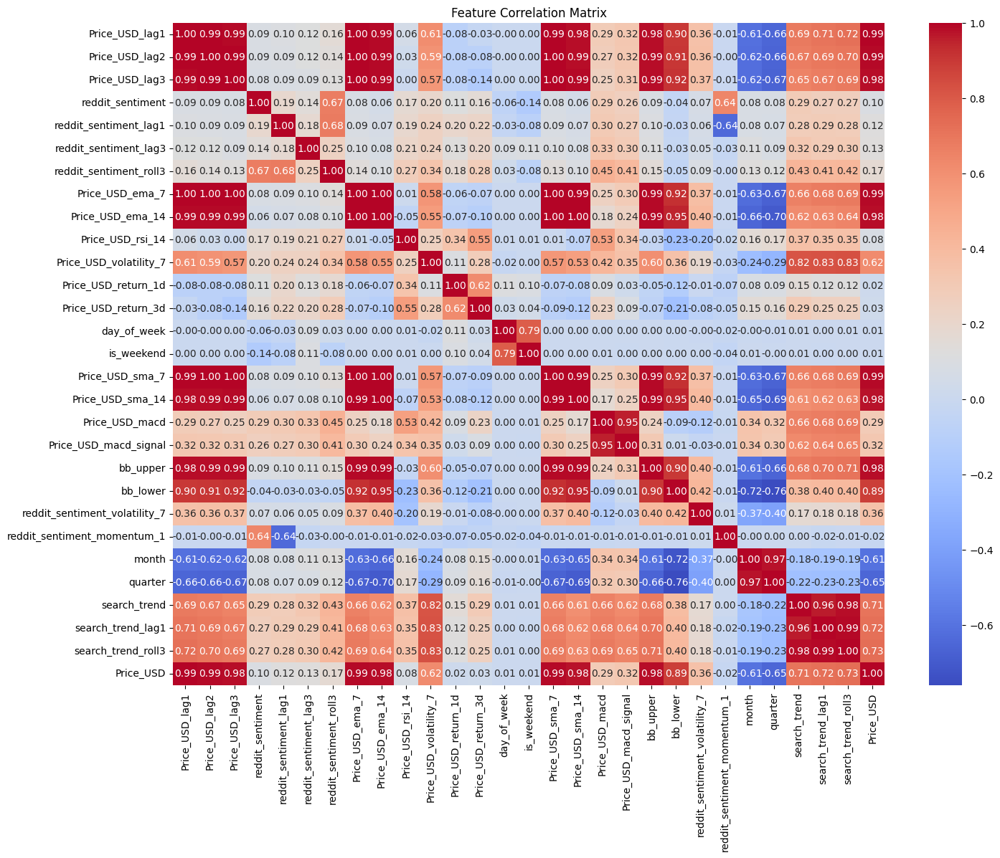

In [250]:
plt.figure(figsize=(16,12))
corr = df_xrp[feature_cols + [target_col]].corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title('Feature Correlation Matrix')
plt.show()

Correlation with target


In [251]:
corr_with_target = corr[target_col].sort_values(ascending=False)
print(corr_with_target)

Price_USD                        1.000000
Price_USD_lag1                   0.993889
Price_USD_ema_7                  0.992869
Price_USD_sma_7                  0.989797
Price_USD_lag2                   0.988422
Price_USD_ema_14                 0.983233
Price_USD_lag3                   0.983081
bb_upper                         0.981322
Price_USD_sma_14                 0.977486
bb_lower                         0.889023
search_trend_roll3               0.731264
search_trend_lag1                0.721624
search_trend                     0.705166
Price_USD_volatility_7           0.619356
reddit_sentiment_volatility_7    0.355667
Price_USD_macd_signal            0.321895
Price_USD_macd                   0.294334
reddit_sentiment_roll3           0.170792
reddit_sentiment_lag3            0.133391
reddit_sentiment_lag1            0.121938
reddit_sentiment                 0.097925
Price_USD_rsi_14                 0.084127
Price_USD_return_3d              0.026778
Price_USD_return_1d              0

Histogram for key features & target


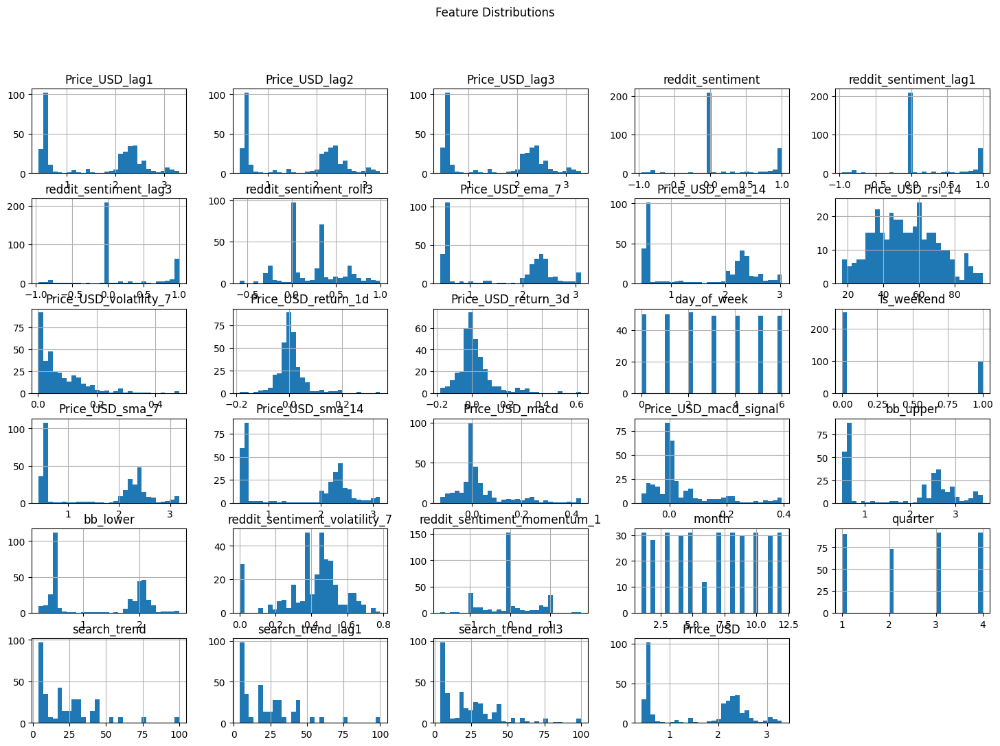

In [252]:
df_xrp[feature_cols + [target_col]].hist(bins=30, figsize=(18,12))
plt.suptitle('Feature Distributions')
plt.show()


Boxplots to check outliers


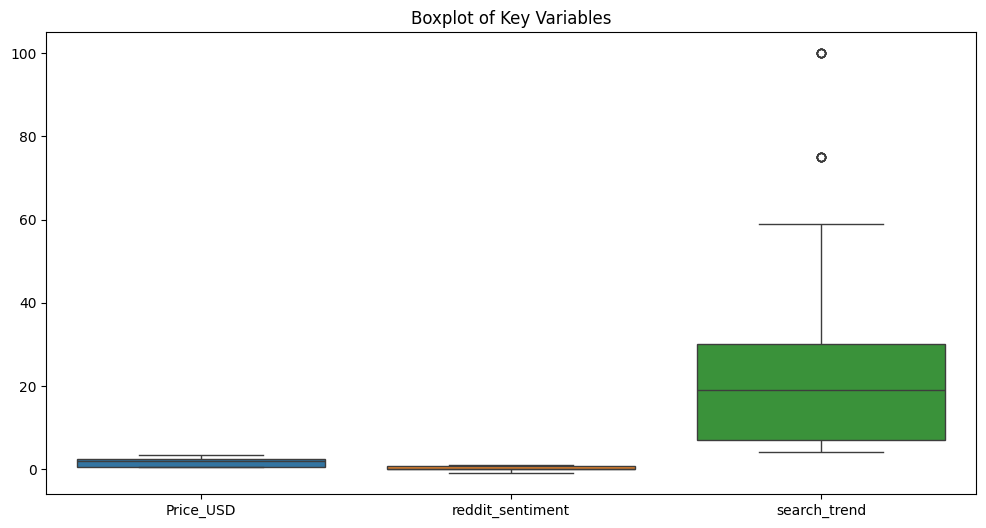

In [253]:
plt.figure(figsize=(12,6))
sns.boxplot(data=df_xrp[["Price_USD", "reddit_sentiment", "search_trend"]])
plt.title("Boxplot of Key Variables")
plt.show()

Sentiment and social media activity relate to memecoin price movements


In [256]:


fig = go.Figure()

fig.add_trace(go.Scatter(x=df_xrp['Timestamp'], y=df_xrp['Price_USD'], name='Memecoin Price (USD)', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=df_xrp['Timestamp'], y=df_xrp['reddit_sentiment'], name='Sentiment Score', yaxis='y2', line=dict(color='red')))

fig.update_layout(
    title="Memecoin Price vs Sentiment Score Over Time",
    xaxis=dict(title='Date'),
    yaxis=dict(title='Price (USD)', side='left'),
    yaxis2=dict(title='Sentiment Score', overlaying='y', side='right'),
    legend=dict(x=0.01, y=0.99)
)

fig.show()


## 5. Predictive Modeling for Memecoin Price (DodgeCoin)


In [33]:
# Train XGBoost regressor 
# Define parameter grid
print('Training XGBoost regressor ...')
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0]
}

# Initialize XGBRegressor
xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid,
                           scoring='neg_mean_squared_error', cv=3, verbose=2, n_jobs=-1)

# Fit grid search on training data
grid_search.fit(X_train, y_train)

print("Best parameters found:", grid_search.best_params_)

# Use the best estimator to predict
xgb_best = grid_search.best_estimator_

xgb_pred = xgb_best.predict(X_test)

xgb_mse = mean_squared_error(y_test, xgb_pred)
xgb_mae = mean_absolute_error(y_test, xgb_pred)
xgb_r2 = r2_score(y_test, xgb_pred)

print(f"XGBoost Results:")
print(f"Best parameters: {grid_search.best_params_}")
print(f"MSE: {xgb_mse:.4f}")
print(f"MAE: {xgb_mae:.4f}")
print(f"R²: {xgb_r2:.4f}")

Training XGBoost regressor ...
Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best parameters found: {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.7}
XGBoost Results:
Best parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.7}
MSE: 0.0001
MAE: 0.0062
R²: 0.9104


In [34]:
#Train Random Forest regressor
print("Training Random Forest regressor ...")
rf_param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, None]
}

rf = RandomForestRegressor(random_state=42)
rf_grid = GridSearchCV(rf, rf_param_grid, scoring='neg_mean_squared_error', cv=3, n_jobs=-1)
rf_grid.fit(X_train, y_train)

rf_best = rf_grid.best_estimator_
rf_pred = rf_best.predict(X_test)

rf_mse = mean_squared_error(y_test, rf_pred)
rf_mae = mean_absolute_error(y_test, rf_pred)
rf_r2 = r2_score(y_test, rf_pred)

print(f"Random Forest Results:")
print(f"Best parameters: {rf_grid.best_params_}")
print(f"MSE: {rf_mse:.8f}")
print(f"MAE: {rf_mae:.8f}")
print(f"R²: {rf_r2:.4f}")

# Feature importance
feature_importance = pd.DataFrame({
    'feature': feature_cols,
    'importance': rf_best.feature_importances_
}).sort_values('importance', ascending=False).reset_index(drop=True)

print(f"\nTop 10 Important Features:")
print(feature_importance.head(10))


Training Random Forest regressor ...
Random Forest Results:
Best parameters: {'max_depth': 5, 'n_estimators': 100}
MSE: 0.00008684
MAE: 0.00736256
R²: 0.8935

Top 10 Important Features:
            feature  importance
0    Price_USD_lag1    0.471552
1   Price_USD_ema_7    0.346082
2   Price_USD_sma_7    0.074213
3    Price_USD_lag2    0.035719
4  Price_USD_sma_14    0.018368
5    Price_USD_lag3    0.017217
6    Price_USD_macd    0.015887
7  Price_USD_ema_14    0.010593
8          bb_upper    0.002686
9  Price_USD_rsi_14    0.002093


In [35]:
#Train Random Forest regressor
print('Training Gradient Boosting regressor ...')
gb_param_grid = {
    'n_estimators': [100, 150],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 5]
}

gb = GradientBoostingRegressor(random_state=42)
gb_grid = GridSearchCV(gb, gb_param_grid, scoring='neg_mean_squared_error', cv=3, n_jobs=-1)
gb_grid.fit(X_train, y_train)

gb_best = gb_grid.best_estimator_
gb_pred = gb_best.predict(X_test)

gb_mse = mean_squared_error(y_test, gb_pred)
gb_mae = mean_absolute_error(y_test, gb_pred)
gb_r2 = r2_score(y_test, gb_pred)

print(f"Gradient Boosting Results:")
print(f"Best parameters: {gb_grid.best_params_}")
print(f"Test MSE: {gb_mse:.4f}")
print(f"Test MAE: {gb_mae:.4f}")
print(f"Test R²: {gb_r2:.4f}")


Training Gradient Boosting regressor ...
Gradient Boosting Results:
Best parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 150}
Test MSE: 0.0000
Test MAE: 0.0049
Test R²: 0.9485


In [46]:
#Train LSTM model
print('Training LSTM ...')
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y.values.reshape(-1, 1))

X_lstm = np.array([X_scaled[i-3:i] for i in range(3, len(X_scaled))])
y_lstm = y_scaled[3:]

X_train_lstm = X_lstm[:split_idx-3]
X_test_lstm = X_lstm[split_idx-3:]
y_train_lstm = y_lstm[:split_idx-3]
y_test_lstm = y_lstm[split_idx-3:]

lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='relu', input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_train_lstm, y_train_lstm, epochs=20, verbose=0)

lstm_pred = lstm_model.predict(X_test_lstm)
lstm_pred_inv = scaler.inverse_transform(lstm_pred)
y_test_lstm_inv = scaler.inverse_transform(y_test_lstm)

lstm_mse = mean_squared_error(y_test_lstm, lstm_pred)
lstm_mae = mean_absolute_error(y_test_lstm, lstm_pred)
lstm_r2 = r2_score(y_test_lstm, lstm_pred)

print(f"\nLSTM Results (scaled):")
print(f"MSE: {lstm_mse:.4f}")
print(f"MAE: {lstm_mae:.4f}")
print(f"R²: {lstm_r2:.4f}")

Training LSTM ...
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step

LSTM Results (scaled):
MSE: 0.0044
MAE: 0.0503
R²: 0.2474


Model Performance Comparison:
               Model       MSE       MAE        R²
0  Gradient Boosting  0.000042  0.004899  0.948458
1            XGBoost  0.000073  0.006240  0.910410
2      Random Forest  0.000087  0.007363  0.893512
3               LSTM  0.004387  0.050290  0.247446


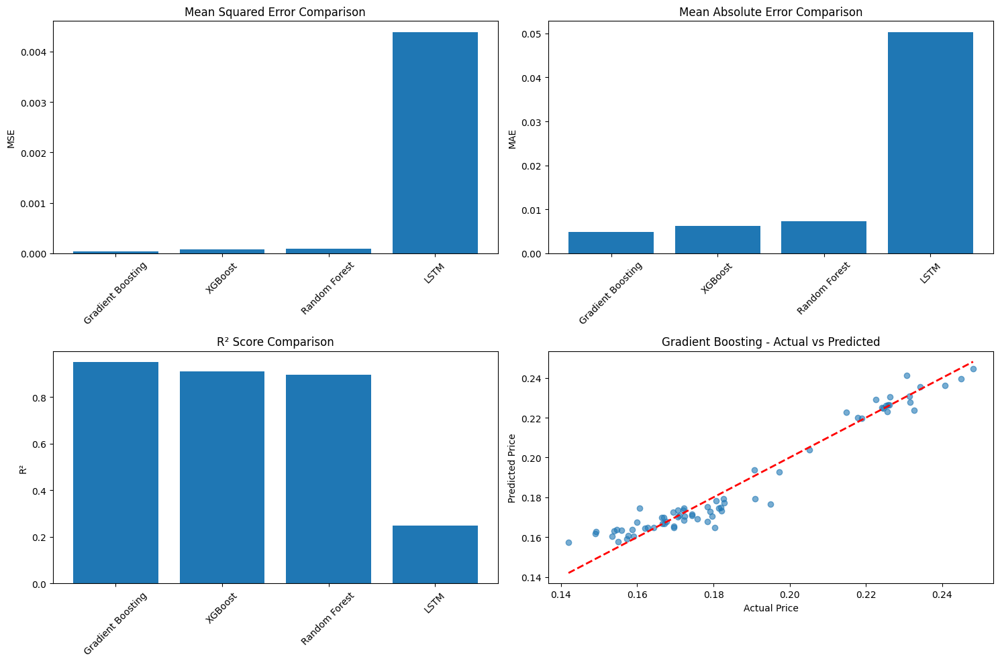

In [47]:
# Compile results
results_df = pd.DataFrame({
    'Model': ['Random Forest', 'XGBoost', 'Gradient Boosting', 'LSTM'],
    'MSE': [ rf_mse, xgb_mse, gb_mse, lstm_mse],
    'MAE': [rf_mae, xgb_mae, gb_mae, lstm_mae],
    'R²': [rf_r2, xgb_r2, gb_r2, lstm_r2]
})

# Sort by R² score
results_df = results_df.sort_values('R²', ascending=False).reset_index(drop=True)
print("Model Performance Comparison:")
print(results_df)

# Visualize results
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# MSE comparison
axes[0,0].bar(results_df['Model'], results_df['MSE'])
axes[0,0].set_title('Mean Squared Error Comparison')
axes[0,0].set_ylabel('MSE')
axes[0,0].tick_params(axis='x', rotation=45)

# MAE comparison
axes[0,1].bar(results_df['Model'], results_df['MAE'])
axes[0,1].set_title('Mean Absolute Error Comparison')
axes[0,1].set_ylabel('MAE')
axes[0,1].tick_params(axis='x', rotation=45)

# R² comparison
axes[1,0].bar(results_df['Model'], results_df['R²'])
axes[1,0].set_title('R² Score Comparison')
axes[1,0].set_ylabel('R²')
axes[1,0].tick_params(axis='x', rotation=45)

doge_models = {'Random Forest': rf_best, 'XGBoost': xgb_best, 'Gradient Boosting': gb_best, 'LSTM': lstm_model}

# Best model predictions vs actual
best_model_name = results_df.iloc[0]['Model']
if best_model_name == 'Random Forest':
    best_pred = rf_pred
elif best_model_name == 'XGBoost':
    best_pred = xgb_pred
elif best_model_name == 'Gradient Boosting':
    best_pred = gb_pred
else:
    best_pred = lstm_pred

axes[1,1].scatter(y_test, best_pred, alpha=0.6)
axes[1,1].plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
axes[1,1].set_xlabel('Actual Price')
axes[1,1].set_ylabel('Predicted Price')
axes[1,1].set_title(f'{best_model_name} - Actual vs Predicted')

plt.tight_layout()
plt.show()

## 6. Predictive Model for cryptocurrencies (XRP)


**XGBoost Regressor**


In [31]:
# --- 9. Train XGBoost regressor ---
# Define parameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0]
}

# Initialize XGBRegressor
xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid,
                           scoring='neg_mean_squared_error', cv=3, verbose=2, n_jobs=-1)

# Fit grid search on training data
grid_search.fit(X_train_xrp, y_train_xrp)

print("Best parameters found:", grid_search.best_params_)

# Use the best estimator to predict
xgb_best_model = grid_search.best_estimator_
y_pred_xrp = xgb_best_model.predict(X_test_xrp)

mse = mean_squared_error(y_test_xrp, y_pred_xrp)
r2 = r2_score(y_test_xrp, y_pred_xrp)

print(f"Test MSE: {mse:.5f}")
print(f"Test R^2: {r2:.5f}")

Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best parameters found: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 150, 'subsample': 0.7}
Test MSE: 0.00514
Test R^2: 0.77222


**Random Forest**


In [35]:
model_rf = RandomForestRegressor(n_estimators=100, random_state=42)
model_rf.fit(X_train_xrp, y_train_xrp)

y_pred_xrp = model_rf.predict(X_test_xrp)

rmse = sqrt(mean_squared_error(y_test_xrp, y_pred_xrp))
print(f"Test RMSE after tuning: {rmse:.4f}")

rmse, mae, r2 = evaluate_model(y_test_xrp, y_pred_xrp)
print(rmse)
print(r2)

Test RMSE after tuning: 0.0906
0.0906034750578362
0.6360398813277721


**SVR**


In [36]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR())
])

param_grid = {
    'svr__C': [0.1, 1, 10, 100],
    'svr__epsilon': [0.01, 0.1, 0.2, 0.5],
    'svr__kernel': ['rbf', 'linear'],
    'svr__gamma': ['scale', 'auto', 0.001, 0.01, 0.1]
}

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid,
                           cv=5, scoring='neg_mean_squared_error', n_jobs=-1)

# Fit grid search
grid_search.fit(X_train_xrp, y_train_xrp)

print("Best params:", grid_search.best_params_)

# Use best estimator to predict
SVR_best_model = grid_search.best_estimator_
y_pred_xrp = SVR_best_model.predict(X_test_xrp)

mse = mean_squared_error(y_test_xrp, y_pred_xrp)
r2 = r2_score(y_test_xrp, y_pred_xrp)

print(f"Test MSE: {mse:.5f}")
print(f"Test R^2: {r2:.5f}")

Best params: {'svr__C': 100, 'svr__epsilon': 0.01, 'svr__gamma': 0.001, 'svr__kernel': 'rbf'}
Test MSE: 0.00013
Test R^2: 0.99442


**Long Short Term Memory (LSTM)**


In [63]:
# Scaling
scaler_X = MinMaxScaler()
X_scaled_xrp = scaler_X.fit_transform(X_xrp)

scaler_y = MinMaxScaler()
y_scaled_xrp = scaler_y.fit_transform(y_xrp.values.reshape(-1, 1))

# Create sequences for LSTM
time_step = 5
X_lstm_xrp, y_lstm_xrp = [], []

for i in range(time_step, len(X_scaled_xrp)):
    X_lstm_xrp.append(X_scaled_xrp[i - time_step:i])
    y_lstm_xrp.append(y_scaled_xrp[i])

X_lstm_xrp, y_lstm_xrp = np.array(X_lstm_xrp), np.array(y_lstm_xrp)

# Split data
split = int(0.8 * len(X_lstm_xrp))
X_train_lstm_xrp, X_test_lstm_xrp = X_lstm_xrp[:split], X_lstm_xrp[split:]
y_train_lstm_xrp, y_test_lstm_xrp = y_lstm_xrp[:split], y_lstm_xrp[split:]

# Build LSTM model
lstm_model_xrp = Sequential()
lstm_model_xrp.add(LSTM(64, return_sequences=True, input_shape=(X_train_lstm_xrp.shape[1], X_train_lstm_xrp.shape[2])))
lstm_model_xrp.add(Dropout(0.2))
lstm_model_xrp.add(LSTM(64))
lstm_model_xrp.add(Dropout(0.2))
lstm_model_xrp.add(Dense(1))


from keras.optimizers import Adam
optimizer = Adam(learning_rate=0.001)  
lstm_model_xrp.compile(optimizer=optimizer, loss='mean_squared_error')

early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history_xrp = lstm_model_xrp.fit(
    X_train_lstm_xrp, y_train_lstm_xrp,
    epochs=50,
    batch_size=64,
    validation_data=(X_test_lstm_xrp, y_test_lstm_xrp),
    callbacks=[early_stop],
    verbose=1
)

# Predict and inverse scale
y_pred_scaled_xrp = lstm_model_xrp.predict(X_test_lstm_xrp)
y_pred_lstm_xrp = scaler_y.inverse_transform(y_pred_scaled_xrp)
y_true_lstm_xrp = scaler_y.inverse_transform(y_test_lstm_xrp)

# Evaluate
mse_xrp = mean_squared_error(y_true_lstm_xrp, y_pred_lstm_xrp)
r2_xrp = r2_score(y_true_lstm_xrp, y_pred_lstm_xrp)

print(f"Test MSE: {mse_xrp:.5f}")
print(f"Test R^2: {r2_xrp:.5f}")


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - loss: 0.1364 - val_loss: 0.0015
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0422 - val_loss: 0.0030
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0131 - val_loss: 0.0121
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.0143 - val_loss: 0.0023
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0104 - val_loss: 0.0045
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.0101 - val_loss: 0.0036
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 181ms/step
Test MSE: 0.01281
Test R^2: 0.43435


Model Evaluation


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


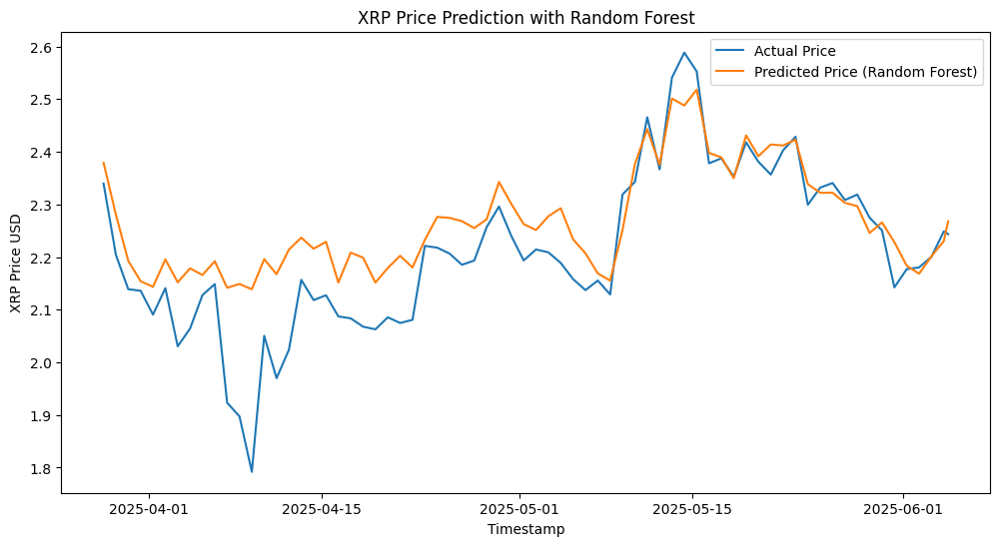

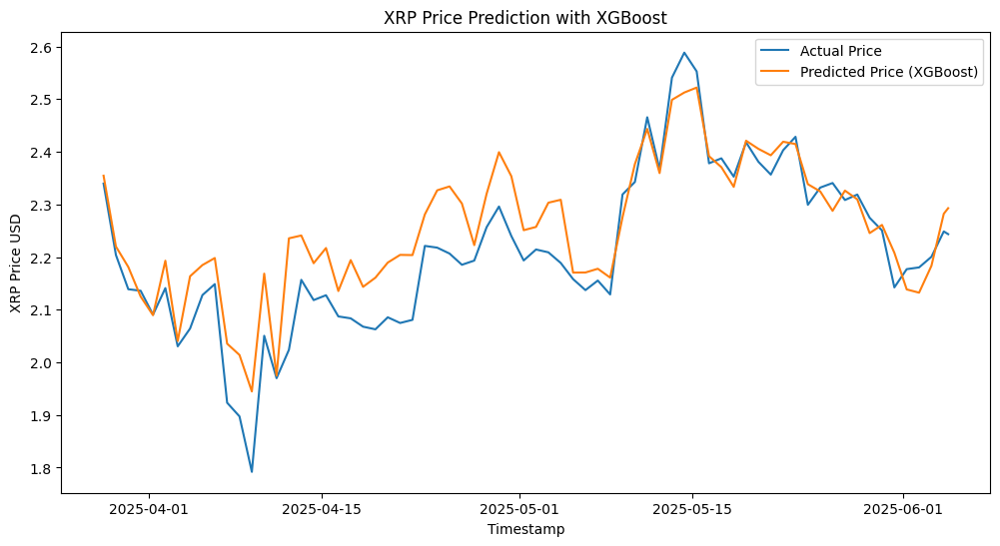

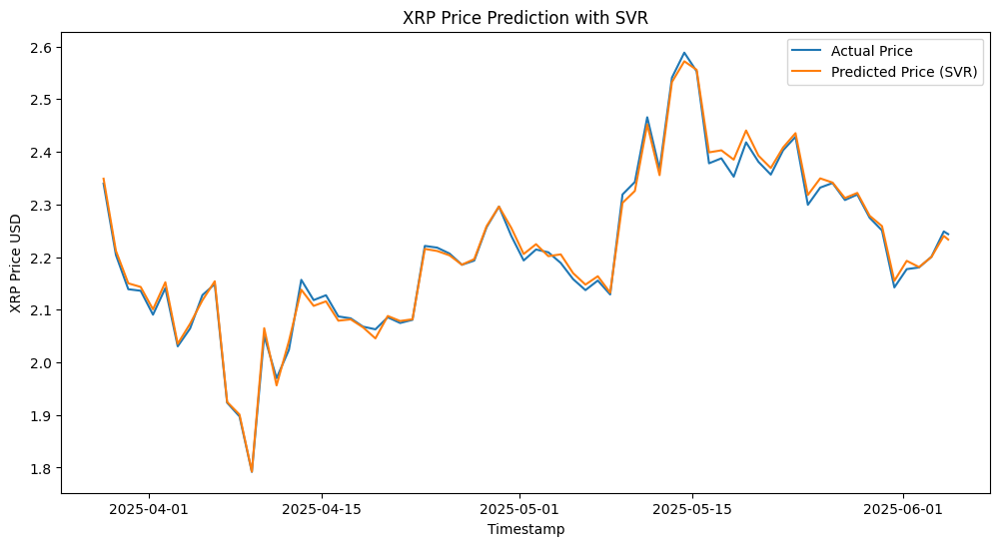

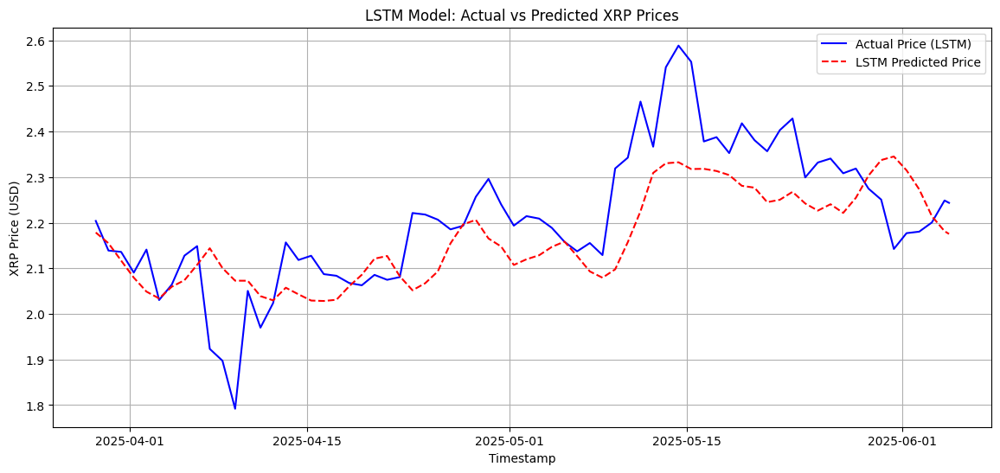

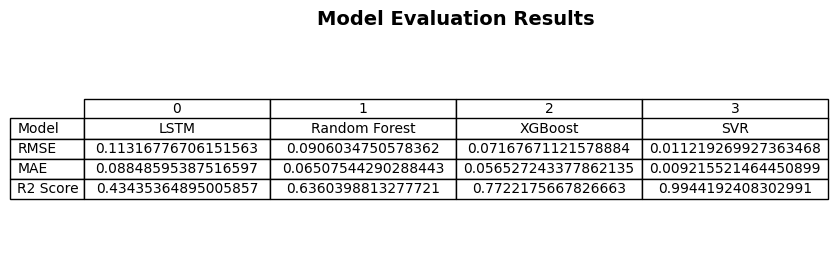

In [66]:
# Evaluation function
def evaluate_model(y_true, y_pred):
    rmse = sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    return rmse, mae, r2

# Dictionary of models
models = {
    'Random Forest': model_rf,
    'XGBoost': xgb_best_model,
    'SVR': SVR_best_model  # from grid search pipeline
    
}
y_pred_scaled = lstm_model_xrp.predict(X_test_lstm_xrp,)
y_pred_lstm = scaler_y.inverse_transform(y_pred_scaled_xrp)
y_true_lstm = scaler_y.inverse_transform(y_test_lstm_xrp)

rmse_lstm, mae_lstm, r2_lstm = evaluate_model(y_true_lstm, y_pred_lstm)

# Collect LSTM results
results = [{
    'Model': 'LSTM',
    'RMSE': rmse_lstm,
    'MAE': mae_lstm,
    'R2 Score': r2_lstm
}]

for name, model in models.items():
    y_pred = model.predict(X_test_xrp)
    rmse, mae, r2 = evaluate_model(y_test_xrp, y_pred)
    results.append({
        'Model': name,
        'RMSE': rmse,
        'MAE': mae,
        'R2 Score': r2
    })

    plt.figure(figsize=(12, 6))
    plt.plot(df_xrp["Timestamp"].iloc[split_idx:], y_test_xrp, label="Actual Price")
    plt.plot(df_xrp["Timestamp"].iloc[split_idx:], y_pred, label=f"Predicted Price ({name})")
    plt.xlabel("Timestamp")
    plt.ylabel("XRP Price USD")
    plt.title(f"XRP Price Prediction with {name}")
    plt.legend()
    plt.show()

# Plot for LSTM (offset timestamps by time_step)
plt.figure(figsize=(14, 6))
plt.plot(df_xrp["Timestamp"].iloc[split + time_step:], y_true_lstm, label="Actual Price (LSTM)", color='blue')
plt.plot(df_xrp["Timestamp"].iloc[split + time_step:], y_pred_lstm, label="LSTM Predicted Price", color='red', linestyle='--')
plt.xlabel("Timestamp")
plt.ylabel("XRP Price (USD)")
plt.title("LSTM Model: Actual vs Predicted XRP Prices")
plt.legend()
plt.grid(True)
plt.show()

results_df = pd.DataFrame(results).T  # Transpose so models are rows

# Step 2: Plot the table
fig, ax = plt.subplots(figsize=(8, 3))  # Adjust size as needed
ax.axis('off')  # Hide axes

# Create the table in the figure
table = ax.table(cellText=results_df.values,
                 colLabels=results_df.columns,
                 rowLabels=results_df.index,
                 cellLoc='center',
                 loc='center')

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1.2, 1.2)  # Resize table

plt.title("Model Evaluation Results", fontsize=14, fontweight='bold')
plt.show()



Visualize Metric across coins


Text(0, 0.5, 'Predicted Price')

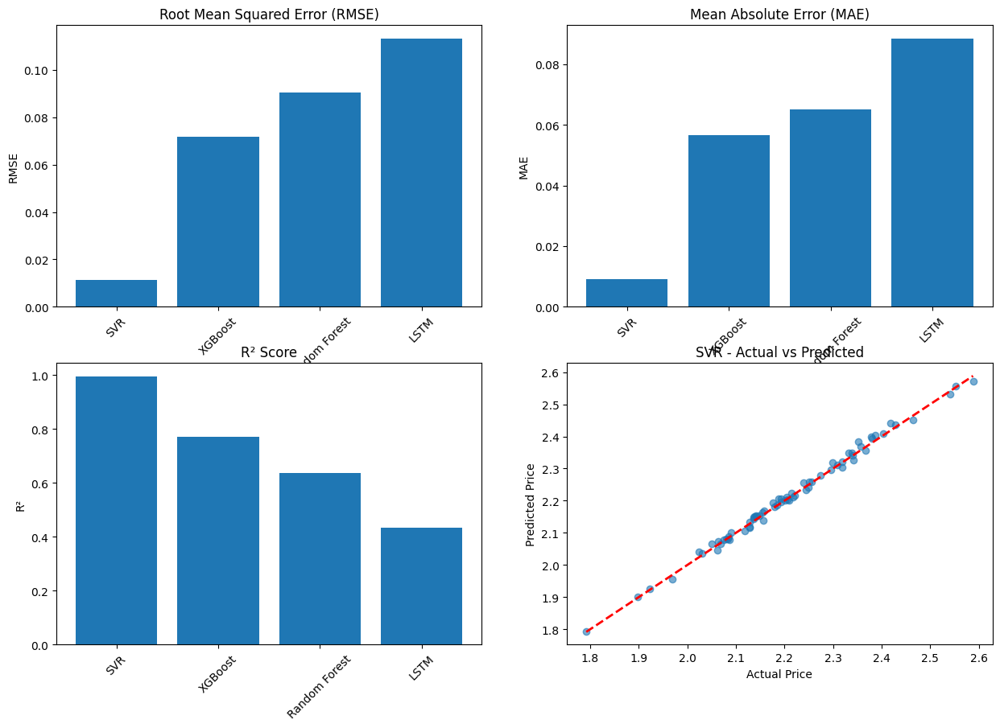

In [67]:
# --- Plot 3 Metric Comparisons ---
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# MSE
axes[0, 0].bar(results_df_sorted['Model'], results_df_sorted['RMSE'])
axes[0, 0].set_title('Root Mean Squared Error (RMSE)')
axes[0, 0].set_ylabel('RMSE')
axes[0, 0].tick_params(axis='x', rotation=45)

# MAE
axes[0, 1].bar(results_df_sorted['Model'], results_df_sorted['MAE'])
axes[0, 1].set_title('Mean Absolute Error (MAE)')
axes[0, 1].set_ylabel('MAE')
axes[0, 1].tick_params(axis='x', rotation=45)

# R²
axes[1, 0].bar(results_df_sorted['Model'], results_df_sorted['R2 Score'])
axes[1, 0].set_title('R² Score')
axes[1, 0].set_ylabel('R²')
axes[1, 0].tick_params(axis='x', rotation=45)

# Best Model: Actual vs Predicted
best_model_name = results_df_sorted.iloc[0]['Model']
y_true_best, y_pred_best = predictions[best_model_name]

axes[1, 1].scatter(y_true_best, y_pred_best, alpha=0.6)
axes[1, 1].plot([min(y_true_best), max(y_true_best)], [min(y_true_best), max(y_true_best)], 'r--', lw=2)
axes[1, 1].set_title(f'{best_model_name} - Actual vs Predicted')
axes[1, 1].set_xlabel('Actual Price')
axes[1, 1].set_ylabel('Predicted Price')

market volatility of coins over date


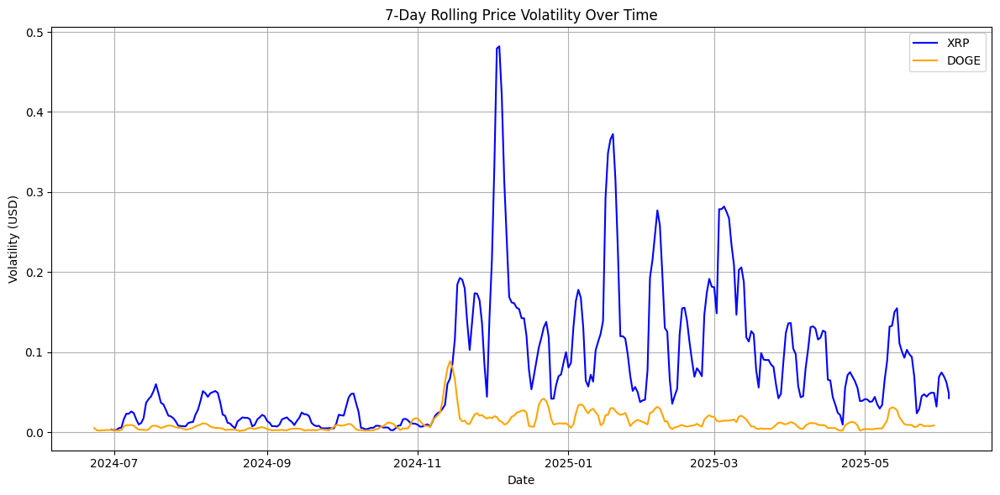

In [81]:
import matplotlib.pyplot as plt

# Calculate 7-day rolling volatility
volatility_xrp = df_xrp[["date", "Price_USD"]].copy()
volatility_doge = df[["date", "Price_USD"]].copy()

volatility_xrp["volatility"] = volatility_xrp["Price_USD"].rolling(7).std()
volatility_doge["volatility"] = volatility_doge["Price_USD"].rolling(7).std()

# Plot line chart
plt.figure(figsize=(12, 6))
plt.plot(volatility_xrp["date"], volatility_xrp["volatility"], label="XRP", color="blue")
plt.plot(volatility_doge["date"], volatility_doge["volatility"], label="DOGE", color="orange")

plt.title("7-Day Rolling Price Volatility Over Time")
plt.xlabel("Date")
plt.ylabel("Volatility (USD)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Sentiment Over time for coins


XRP avg sentiment: 0.2206, volatility: 0.4112
DOGE avg sentiment: 0.0160, volatility: 0.0136


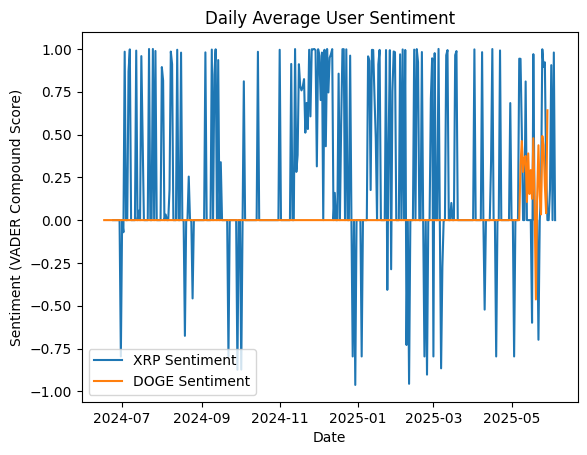

In [82]:
# Average sentiment and volatility
avg_sentiment_xrp = df_xrp['reddit_sentiment'].mean()
vol_sentiment_xrp = df_xrp['reddit_sentiment'].rolling(7).std().mean()

avg_sentiment_doge = df['reddit_sentiment'].mean()
vol_sentiment_doge = df['reddit_sentiment'].rolling(7).std().mean()

print(f"XRP avg sentiment: {avg_sentiment_xrp:.4f}, volatility: {vol_sentiment_xrp:.4f}")
print(f"DOGE avg sentiment: {avg_sentiment_doge:.4f}, volatility: {vol_sentiment_doge:.4f}")

# Plot sentiment trends
plt.plot(df_xrp['date'], df_xrp['reddit_sentiment'], label='XRP Sentiment')
plt.plot(df['date'], df['reddit_sentiment'], label='DOGE Sentiment')
plt.title('Daily Average User Sentiment')
plt.xlabel('Date')
plt.ylabel('Sentiment (VADER Compound Score)')
plt.legend()
plt.show()


## 7. Statistical tests


Comparison of Volume


In [72]:
import scipy.stats as stats

# Assuming volatility columns already exist
vol_dogecoin = df['Total_Volume_USD'].dropna()
vol_xrp = df_xrp['Total_Volume_USD'].dropna()

t_stat, p_val = stats.ttest_ind(vol_dogecoin, vol_xrp)
print(f"T-statistic: {t_stat:.4f}, P-value: {p_val:.4f}")

T-statistic: -4.9457, P-value: 0.0000


There is strong evidence that the trading volume of Dogecoin is significantly lower than XRP in your dataset.


Model Performance Comparison in XRP (ANOVA & Tukey HSD)


In [89]:
import pandas as pd
import numpy as np
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Prepare long-form data for ANOVA
data_for_anova = []

# For non-LSTM models:
for name, model in models.items():
    y_pred = model.predict(X_test_xrp)
    errors = np.abs(y_test_xrp - y_pred)  # absolute error per prediction time step
    
    # Append errors and model names to list
    for err in errors:
        data_for_anova.append({'Model': name, 'Error': err})

# For LSTM model:
errors_lstm = np.abs(y_true_lstm.flatten() - y_pred_lstm.flatten())  # flatten in case of 2D array
for err in errors_lstm:
    data_for_anova.append({'Model': 'LSTM', 'Error': err})

# Convert to DataFrame
anova_df = pd.DataFrame(data_for_anova)

# Check the first few rows
print(anova_df.head(10))

# Fit the ANOVA model
model = ols('Error ~ Model', data=anova_df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print("\nANOVA results:\n", anova_table)

# If significant, do Tukey post-hoc test
from statsmodels.stats.multicomp import pairwise_tukeyhsd

if anova_table['PR(>F)'][0] < 0.05:
    tukey = pairwise_tukeyhsd(endog=anova_df['Error'], groups=anova_df['Model'], alpha=0.05)
    print("\nTukey HSD post-hoc test results:\n", tukey.summary())


             Model     Error
0    Random Forest  0.039471
1    Random Forest  0.076337
2    Random Forest  0.053730
3    Random Forest  0.018139
4    Random Forest  0.052922
..             ...       ...
264           LSTM  0.152683
265           LSTM  0.160834
266           LSTM  0.057050
267           LSTM  0.105476
268           LSTM  0.100188

[269 rows x 2 columns]

ANOVA results:
             sum_sq     df          F        PR(>F)
Model     0.231351    3.0  27.888014  8.921666e-16
Residual  0.760439  275.0        NaN           NaN

Tukey HSD post-hoc test results:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
    group1        group2    meandiff p-adj   lower   upper  reject
------------------------------------------------------------------
         LSTM Random Forest  -0.0234 0.0451 -0.0465 -0.0004   True
         LSTM           SVR  -0.0793    0.0 -0.1023 -0.0562   True
         LSTM       XGBoost   -0.032 0.0023  -0.055 -0.0089   True
Random Forest        

The one-way ANOVA test revealed significant differences in the prediction errors across the four models (F(3, 275) = 27.89, p < 0.001). Post-hoc Tukey HSD tests showed that the LSTM model significantly outperformed the Random Forest, SVR, and XGBoost models with lower mean absolute errors (p < 0.05). Random Forest and XGBoost had comparable performance, both better than SVR, which had the highest errors among all models. These results indicate that the LSTM model provides the most accurate price predictions for XRP among the tested approaches.


Model Performance Comparision in Dogecoin (ANOVA & Tukey)


In [51]:
import pandas as pd
import numpy as np
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols

from statsmodels.formula.api import ols
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd

data_for_anova = []

for name, model in doge_models.items():
    if name == 'LSTM':
        # Use precomputed predictions for LSTM
        y_pred = lstm_pred_inv.flatten()
        y_true = y_test_lstm_inv.flatten()
    else:
        y_pred = model.predict(X_test)
        y_true = y_test

    errors = np.abs(y_true - y_pred)

    for err in errors:
        data_for_anova.append({'Model': name, 'Error': err})

# Convert to DataFrame
anova_df = pd.DataFrame(data_for_anova)
print(anova_df.head(10))

# ANOVA
model = ols('Error ~ C(Model)', data=anova_df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print("\nANOVA results:\n", anova_table)

# Post-hoc Tukey HSD
if anova_table['PR(>F)'][0] < 0.05:
    tukey = pairwise_tukeyhsd(endog=anova_df['Error'], groups=anova_df['Model'], alpha=0.05)
    print("\nTukey HSD post-hoc test results:\n", tukey.summary())


           Model     Error
0  Random Forest  0.002874
1  Random Forest  0.000943
2  Random Forest  0.002627
3  Random Forest  0.001489
4  Random Forest  0.011581
5  Random Forest  0.019806
6  Random Forest  0.017472
7  Random Forest  0.000351
8  Random Forest  0.006388
9  Random Forest  0.003287

ANOVA results:
             sum_sq     df          F        PR(>F)
C(Model)  0.008603    3.0  32.800456  3.652664e-18
Residual  0.024129  276.0        NaN           NaN

Tukey HSD post-hoc test results:
          Multiple Comparison of Means - Tukey HSD, FWER=0.05          
      group1          group2    meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------
Gradient Boosting          LSTM   0.0139    0.0  0.0098   0.018   True
Gradient Boosting Random Forest   0.0025 0.4042 -0.0016  0.0065  False
Gradient Boosting       XGBoost   0.0013 0.8313 -0.0027  0.0054  False
             LSTM Random Forest  -0.0114    0.0 -0.0155 -0.0074   True
 

The one-way ANOVA test revealed significant differences in prediction errors across the four models (F(3, 276) = 32.80, p < 0.001). Post-hoc Tukey HSD analysis indicated that the LSTM model significantly outperformed the Random Forest, XGBoost, and Gradient Boosting models, achieving lower mean absolute errors (p < 0.05). In contrast, the tree-based models showed no statistically significant differences among themselves. These findings suggest that the LSTM model delivers the most accurate Dogecoin price predictions among the tested approaches, likely due to its ability to capture temporal patterns in the data.
